### Part 1: Fitting a 2D Image

In [ ]:
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import time
import gdown

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cpu


We first download the image from the web. We normalize the image so the pixels are in between the range of [0,1].

In [ ]:
url = "https://drive.google.com/file/d/1-Cugk9WiFX2CPjWG5taX3868Gdd0PEVT/view?usp=share_link"
gdown.download(url=url, output='starry_night.jpg', quiet=False, fuzzy=True)

# Load painting image
painting = imageio.imread("starry_night.jpg")
painting = torch.from_numpy(np.array(painting, dtype=np.float32)/255.).to(device)
height_painting, width_painting = painting.shape[:2]

Downloading...
From: https://drive.google.com/uc?id=1-Cugk9WiFX2CPjWG5taX3868Gdd0PEVT
To: /content/starry_night.jpg
100%|██████████| 5.65k/5.65k [00:00<00:00, 13.7MB/s]


Downloading...
From: https://drive.google.com/uc?id=15W2EK8LooxTMfD0v5vo2BnBMse5ZzlVj
To: /content/lego_data.npz
100%|██████████| 12.7M/12.7M [00:00<00:00, 247MB/s]


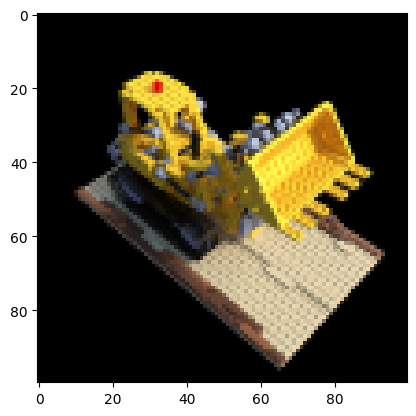

In [ ]:
url = "https://drive.google.com/file/d/15W2EK8LooxTMfD0v5vo2BnBMse5ZzlVj/view?usp=share_link"
gdown.download(url=url, output='lego_data.npz', quiet=False, fuzzy=True)

# Load input images, poses, and intrinsics
data = np.load("lego_data.npz")
images = data["images"]

# Height and width of each image
height_painting, width_painting = images.shape[1:3]

# Camera extrinsics (poses)
poses = data["poses"]
poses = torch.from_numpy(poses).to(device)

# Camera intrinsics
intrinsics = data["intrinsics"]
intrinsics = torch.from_numpy(intrinsics).to(device)

# Hold one image out (for test).
test_image, test_pose = images[101], poses[101]
test_image = torch.from_numpy(test_image).to(device)

plt.imshow(test_image.detach().cpu().numpy())
plt.show()

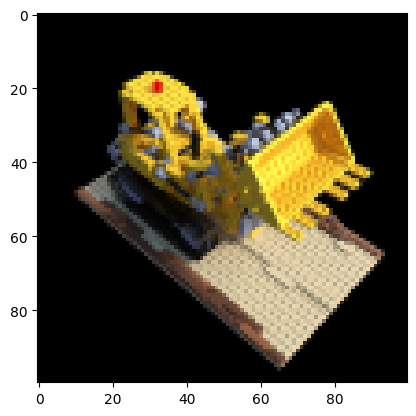

In [ ]:
# Load input images, poses, and intrinsics
data = np.load("lego_data.npz")

# Images
images = data["images"]

# Height and width of each image
height, width = images.shape[1:3]

# Camera extrinsics (poses)
poses = data["poses"]
poses = torch.from_numpy(poses).to(device)

# Camera intrinsics
intrinsics = data["intrinsics"]
intrinsics = torch.from_numpy(intrinsics).to(device)

# Hold one image out (for test).
test_image, test_pose = images[101], poses[101]
test_image = torch.from_numpy(test_image).to(device)

# Map images to device
images = torch.from_numpy(images[:100, ..., :3]).to(device)

plt.imshow(test_image.detach().cpu().numpy())
plt.show()

1.1 Complete the function positional_encoding()

In [ ]:
def positional_encoding(x, num_frequencies=6, incl_input=True):

    """
    Apply positional encoding to the input.

    Args:
    x (torch.Tensor): Input tensor to be positionally encoded.
      The dimension of x is [N, D], where N is the number of input coordinates,
      and D is the dimension of the input coordinate.
    num_frequencies (optional, int): The number of frequencies used in
     the positional encoding (default: 6).
    incl_input (optional, bool): If True, concatenate the input with the
        computed positional encoding (default: True).

    Returns:
    (torch.Tensor): Positional encoding of the input tensor.
    """

    results = []
    if incl_input:
        results.append(x)
    #############################  TODO 1(a) BEGIN  ############################
    # encode input tensor and append the encoded tensor to the list of results.
    freq = 2.0 ** torch.arange(num_frequencies)
    for i in range(num_frequencies):
            results.append(np.sin((2**i)*np.pi*x))
            results.append(np.cos((2**i)*np.pi*x))
    #############################  TODO 1(a) END  ##############################
    return torch.cat(results, dim=-1)

1.2 Complete the class model_2d() that will be used to fit the 2D image.


In [ ]:
class model_2d(nn.Module):

    """
    Define a 2D model comprising of three fully connected layers,
    two relu activations and one sigmoid activation.
    """

    def __init__(self, filter_size=128, num_frequencies=6):
        super().__init__()
        #############################  TODO 1(b) BEGIN  ############################
        self.fc1 = nn.Linear(num_frequencies*4 + 2, filter_size)
        self.fc2 = nn.Linear(filter_size, filter_size)
        self.fc3 = nn.Linear(filter_size, 3)
        self.relu1 = nn.ReLU()
        self.relu2 = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        #############################  TODO 1(b) END  ##############################

    def forward(self, x):
        #############################  TODO 1(b) BEGIN  ############################
        x = self.fc1(x)
        x = self.relu1(x)
        x = self.fc2(x)
        x = self.relu2(x)
        x = self.fc3(x)
        x = self.sigmoid(x)
        #############################  TODO 1(b) END  ##############################
        return x

You need to complete 1.1 and 1.2 first before completing the train_2d_model function. Don't forget to transfer the completed functions from 1.1 and 1.2 to the part1.py file and upload it to the autograder.

Fill the gaps in the train_2d_model() function to train the model to fit the 2D image.

In [ ]:
def train_2d_model(test_img, num_frequencies, device, model=model_2d, positional_encoding=positional_encoding, show=True):

    # Optimizer parameters
    lr = 5e-4
    iterations = 10000
    height, width = test_img.shape[:2]

    # Number of iters after which stats are displayed
    display = 167

    # Define the model and initialize its weights.
    model2d = model(num_frequencies=num_frequencies)
    model2d.to(device)

    def weights_init(m):
        if isinstance(m, nn.Linear):
            torch.nn.init.xavier_uniform_(m.weight)

    model2d.apply(weights_init)

    #############################  TODO 1(c) BEGIN  ############################
    # Define the optimizer
    optimizer = torch.optim.Adam(model2d.parameters(), lr=lr)
    #############################  TODO 1(c) END  ############################

    # Seed RNG, for repeatability
    seed = 5670
    torch.manual_seed(seed)
    np.random.seed(seed)

    # Lists to log metrics etc.
    psnrs = []
    iternums = []

    t = time.time()
    t0 = time.time()

    #############################  TODO 1(c) BEGIN  ############################
    # Create the 2D normalized coordinates, and apply positional encoding to them

    positional_encoded_coords = np.stack(np.meshgrid(np.linspace(0, 1, height), np.linspace(0, 1, width)), axis=-1)
    positional_encoded_coords_flat = torch.tensor(positional_encoded_coords, dtype=torch.float32).view(height * width, 2)
    positional_encoded_coords = positional_encoding(positional_encoded_coords_flat, num_frequencies)

    #############################  TODO 1(c) END  ############################

    for i in range(iterations+1):
        optimizer.zero_grad()
        #############################  TODO 1(c) BEGIN  ############################
        # Run one iteration
        pred_2d = model2d(positional_encoded_coords)
        pred_3d = pred_2d.view(height, width, 3)

        # Compute mean-squared error between the predicted and target images. Backprop!
        loss = nn.MSELoss()(pred_3d, test_img)
        loss.backward()
        optimizer.step()

        #############################  TODO 1(c) END  ############################

        # Display images/plots/stats
        if i % display == 0 and show:
            #############################  TODO 1(c) BEGIN  ############################
            # Calculate psnr
            psnr = -10 * torch.log10(loss)
            #############################  TODO 1(c) END  ############################

            print("Iteration %d " % i, "Loss: %.4f " % loss.item(), "PSNR: %.2f" % psnr.item(), \
                "Time: %.2f secs per iter" % ((time.time() - t) / display), "%.2f secs in total" % (time.time() - t0))
            t = time.time()

            psnrs.append(psnr.item())
            iternums.append(i)

            plt.figure(figsize=(13, 4))
            plt.subplot(131)
            plt.imshow(pred_3d.detach().cpu().numpy())
            plt.title(f"Iteration 3000")
            plt.subplot(132)
            plt.imshow(test_img.cpu().numpy())
            plt.title("Target image")
            plt.subplot(133)
            plt.plot(iternums, psnrs)
            plt.title("PSNR")
            plt.show()

    print('Done!')
    return pred_3d.detach().cpu()

Train the model to fit the given image without applying positional encoding to the input, and by applying positional encoding of two different frequencies to the input; L = 2 and L = 6.

Iteration 0  Loss: 0.1827  PSNR: 7.38 Time: 0.00 secs per iter 0.11 secs in total


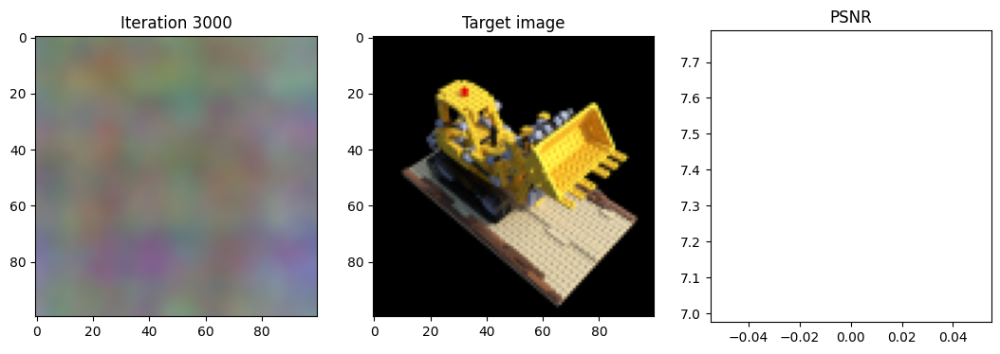

Iteration 167  Loss: 0.0152  PSNR: 18.19 Time: 0.05 secs per iter 7.93 secs in total


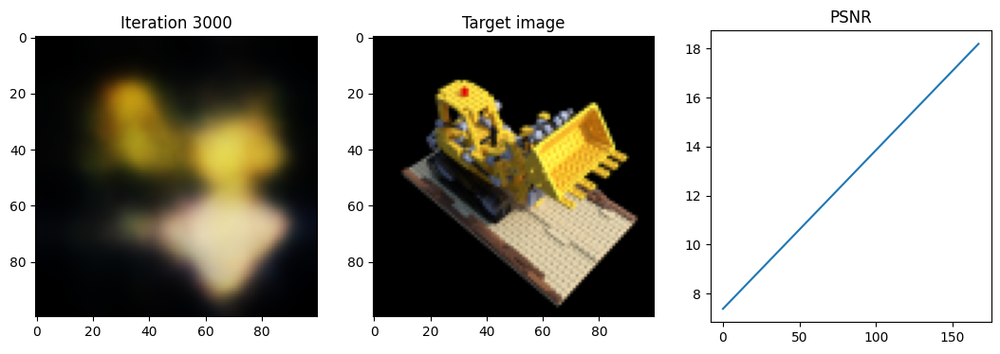

Iteration 334  Loss: 0.0098  PSNR: 20.11 Time: 0.04 secs per iter 14.99 secs in total


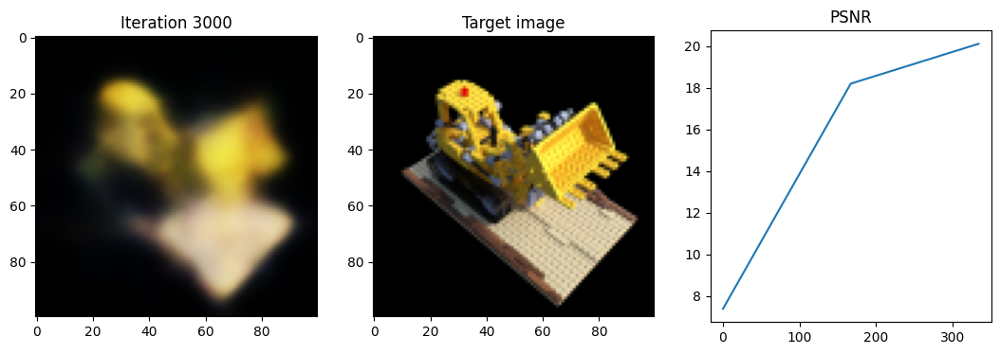

Iteration 501  Loss: 0.0076  PSNR: 21.18 Time: 0.04 secs per iter 22.00 secs in total


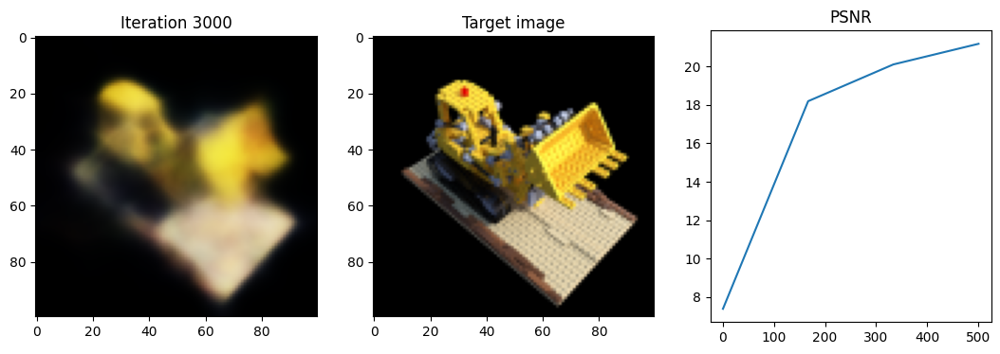

Iteration 668  Loss: 0.0065  PSNR: 21.87 Time: 0.04 secs per iter 29.33 secs in total


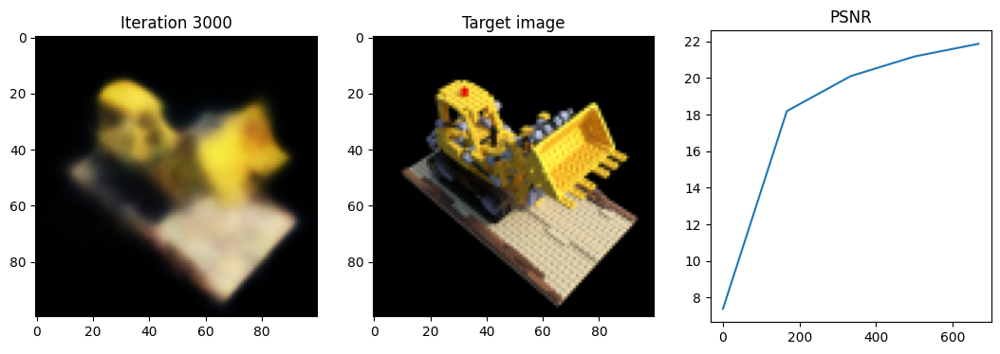

Iteration 835  Loss: 0.0058  PSNR: 22.39 Time: 0.04 secs per iter 35.90 secs in total


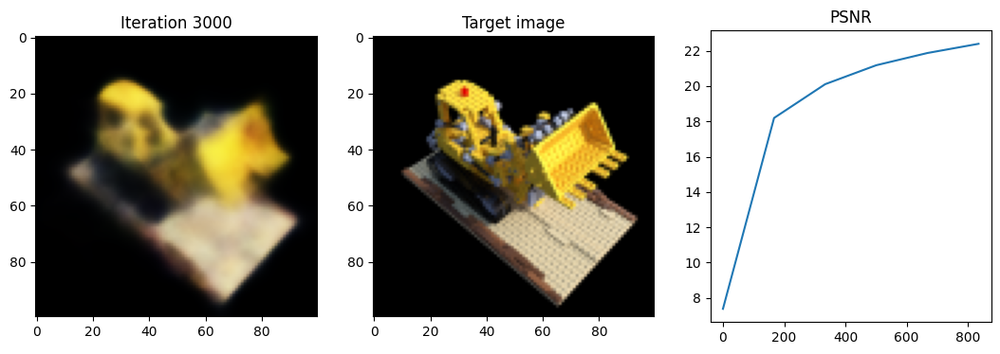

Iteration 1002  Loss: 0.0052  PSNR: 22.85 Time: 0.04 secs per iter 43.21 secs in total


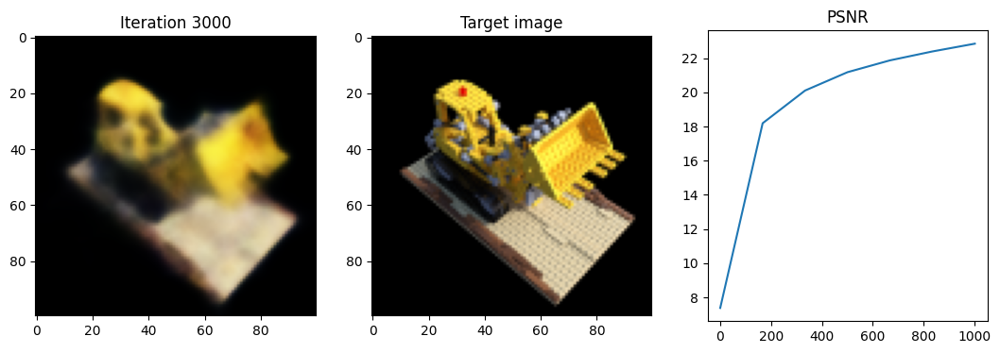

Iteration 1169  Loss: 0.0047  PSNR: 23.29 Time: 0.04 secs per iter 49.65 secs in total


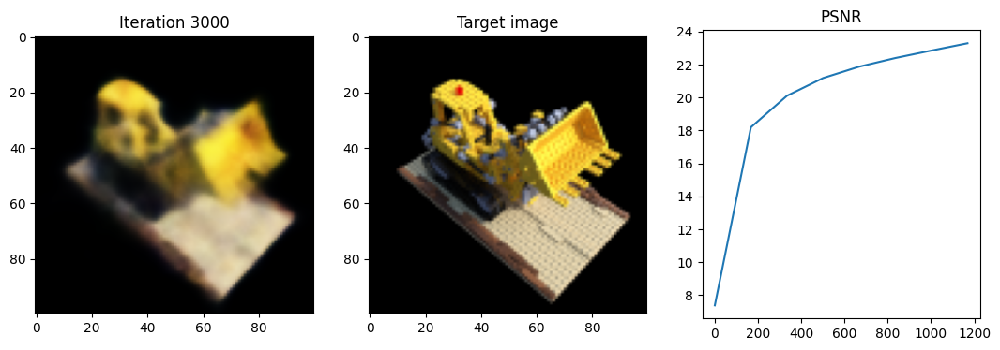

Iteration 1336  Loss: 0.0043  PSNR: 23.68 Time: 0.04 secs per iter 56.89 secs in total


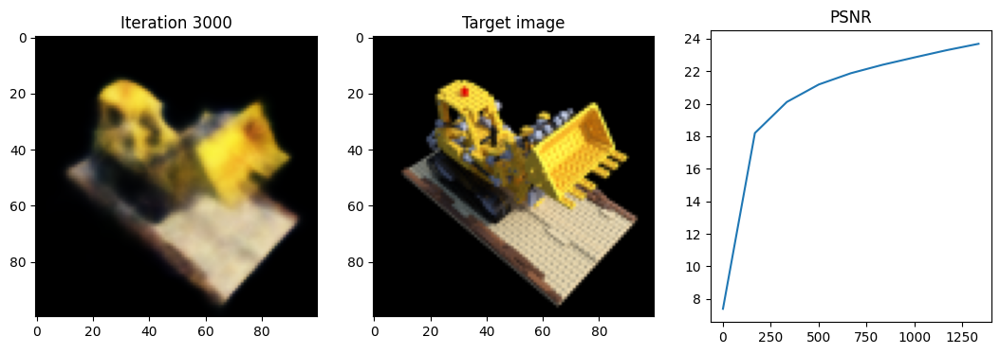

Iteration 1503  Loss: 0.0039  PSNR: 24.08 Time: 0.04 secs per iter 63.27 secs in total


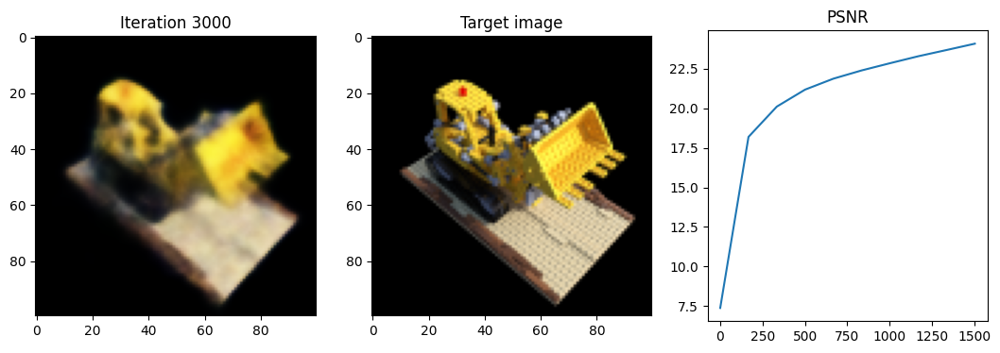

Iteration 1670  Loss: 0.0036  PSNR: 24.46 Time: 0.04 secs per iter 70.54 secs in total


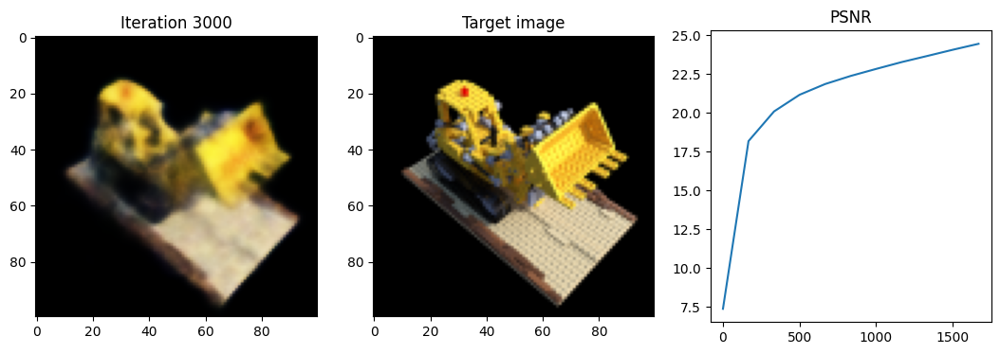

Iteration 1837  Loss: 0.0033  PSNR: 24.82 Time: 0.04 secs per iter 76.98 secs in total


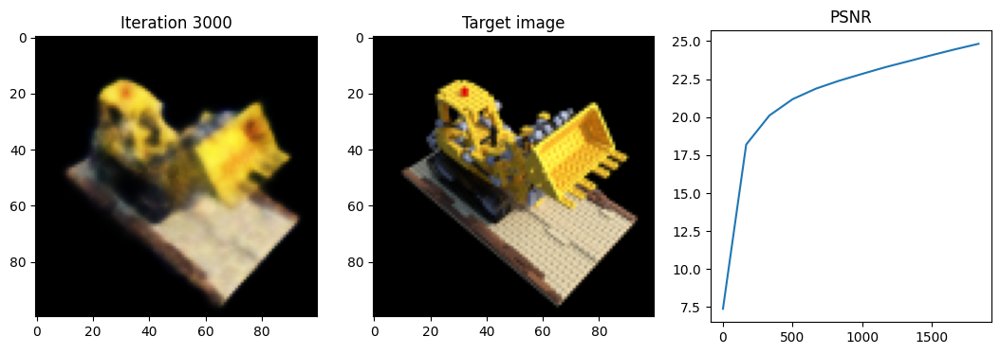

Iteration 2004  Loss: 0.0030  PSNR: 25.19 Time: 0.04 secs per iter 84.29 secs in total


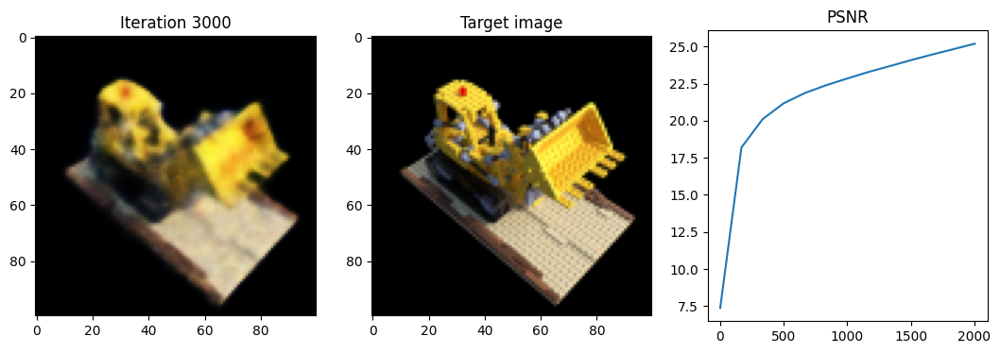

Iteration 2171  Loss: 0.0028  PSNR: 25.51 Time: 0.04 secs per iter 91.05 secs in total


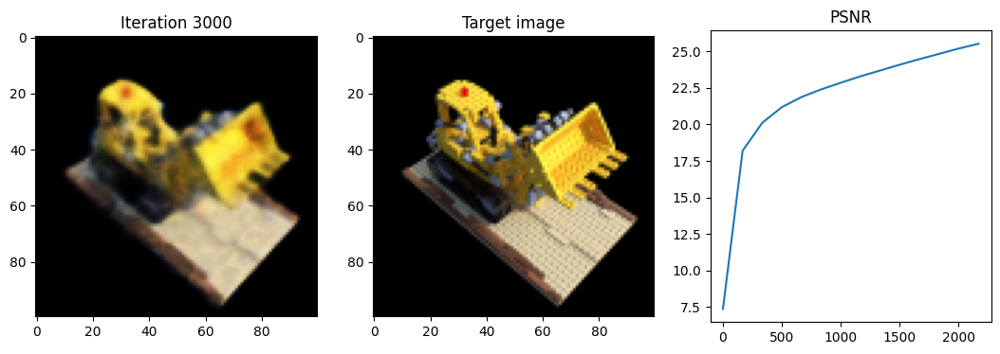

Iteration 2338  Loss: 0.0026  PSNR: 25.82 Time: 0.05 secs per iter 99.34 secs in total


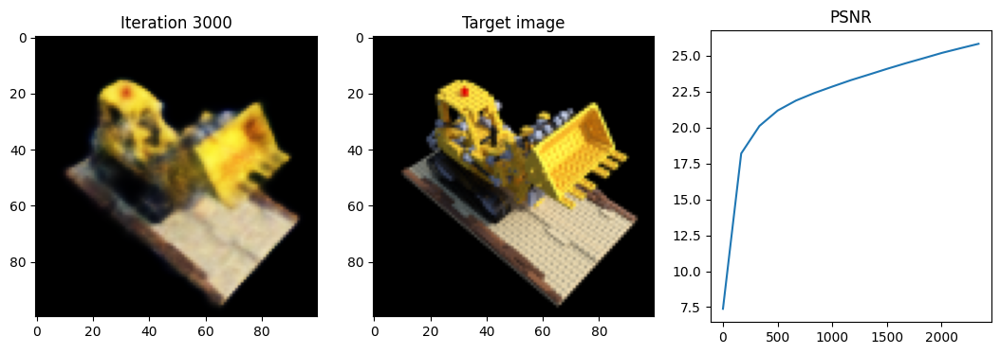

Iteration 2505  Loss: 0.0025  PSNR: 26.08 Time: 0.04 secs per iter 106.60 secs in total


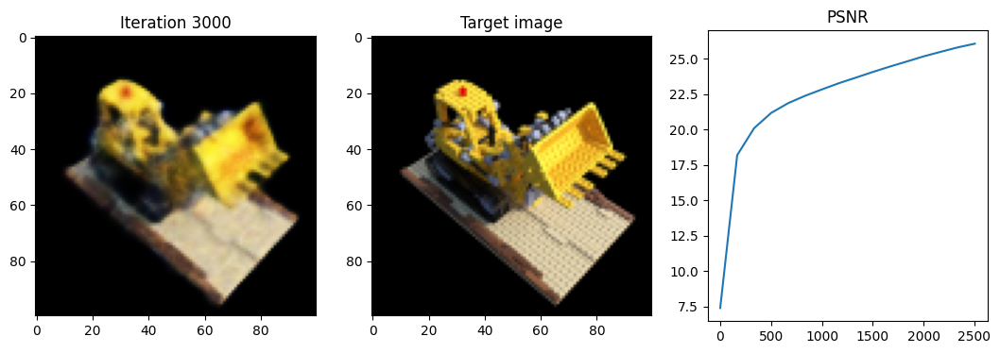

Iteration 2672  Loss: 0.0023  PSNR: 26.33 Time: 0.04 secs per iter 113.54 secs in total


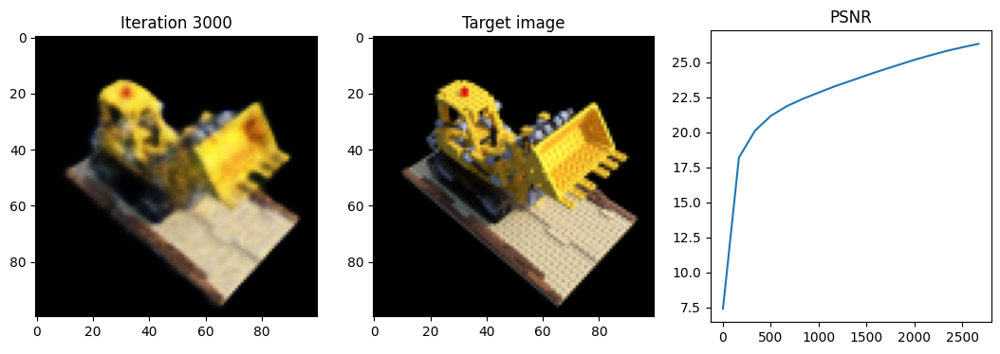

Iteration 2839  Loss: 0.0022  PSNR: 26.56 Time: 0.05 secs per iter 121.21 secs in total


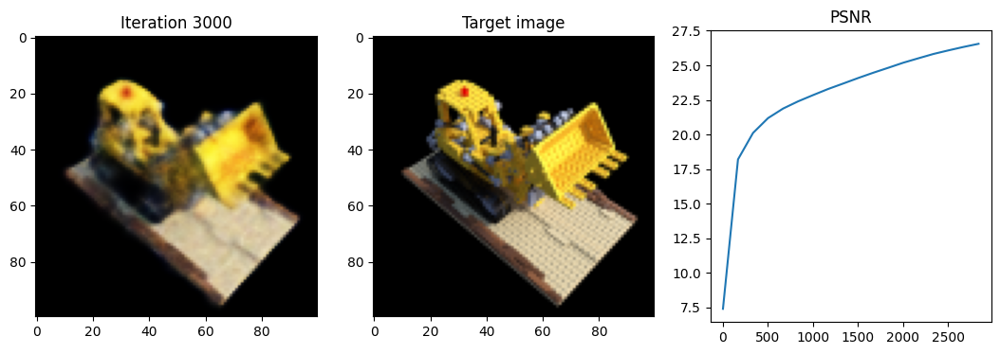

Iteration 3006  Loss: 0.0021  PSNR: 26.77 Time: 0.04 secs per iter 128.25 secs in total


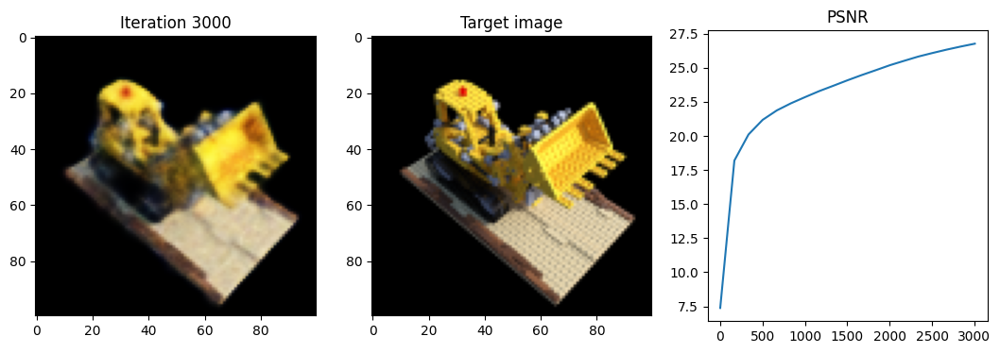

Iteration 3173  Loss: 0.0020  PSNR: 26.93 Time: 0.05 secs per iter 136.91 secs in total


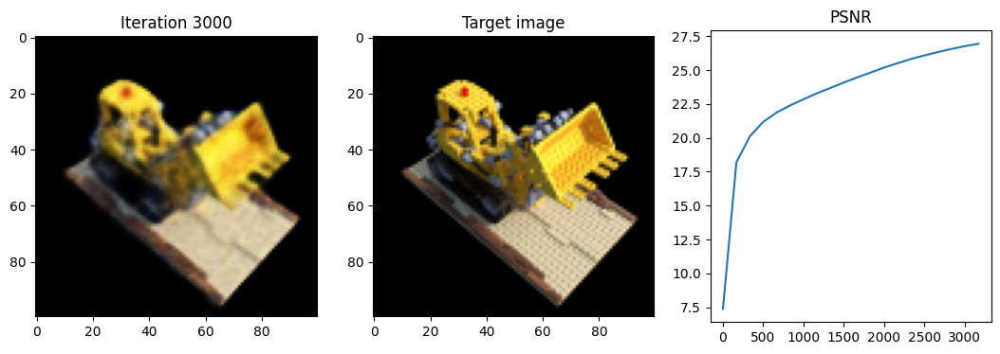

Iteration 3340  Loss: 0.0019  PSNR: 27.11 Time: 0.06 secs per iter 146.21 secs in total


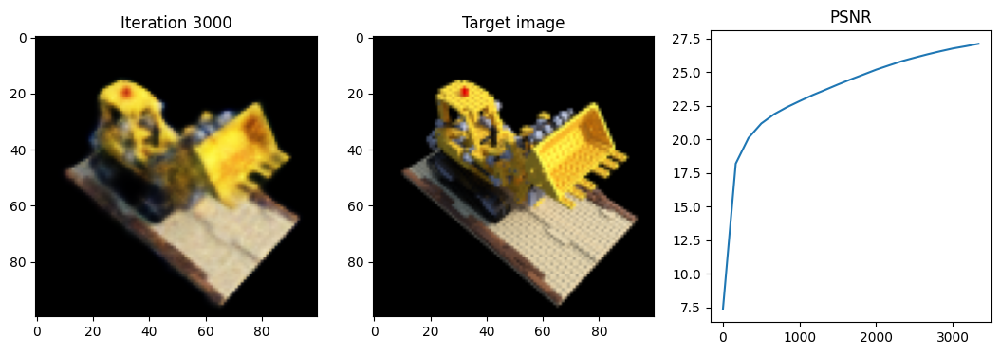

Iteration 3507  Loss: 0.0019  PSNR: 27.29 Time: 0.06 secs per iter 155.75 secs in total


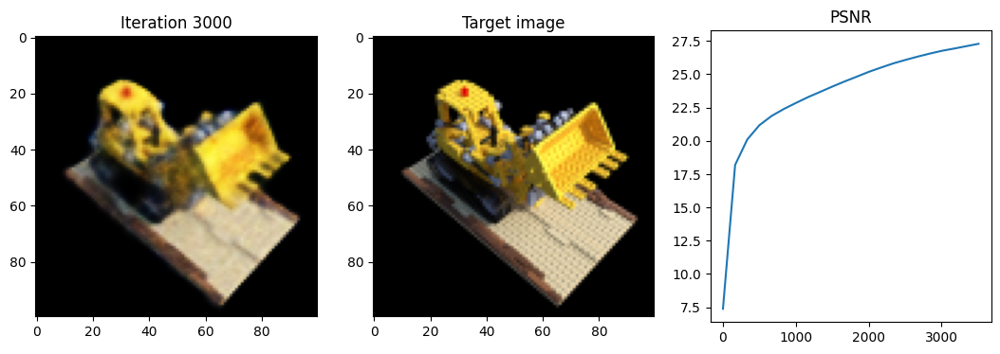

Iteration 3674  Loss: 0.0018  PSNR: 27.46 Time: 0.07 secs per iter 167.04 secs in total


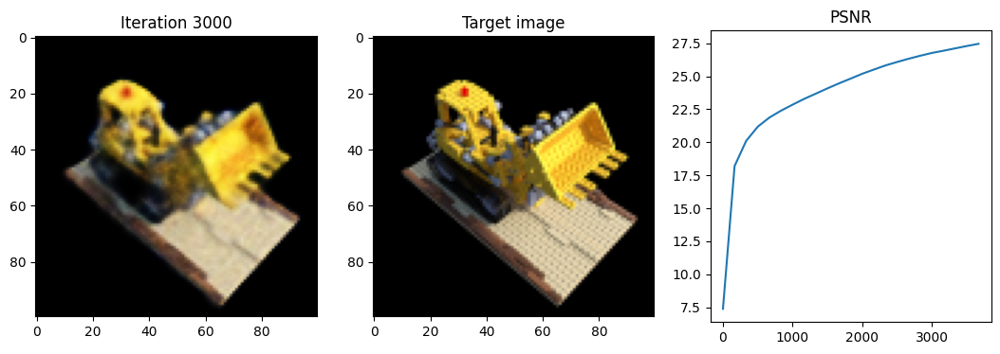

Iteration 3841  Loss: 0.0017  PSNR: 27.57 Time: 0.07 secs per iter 178.62 secs in total


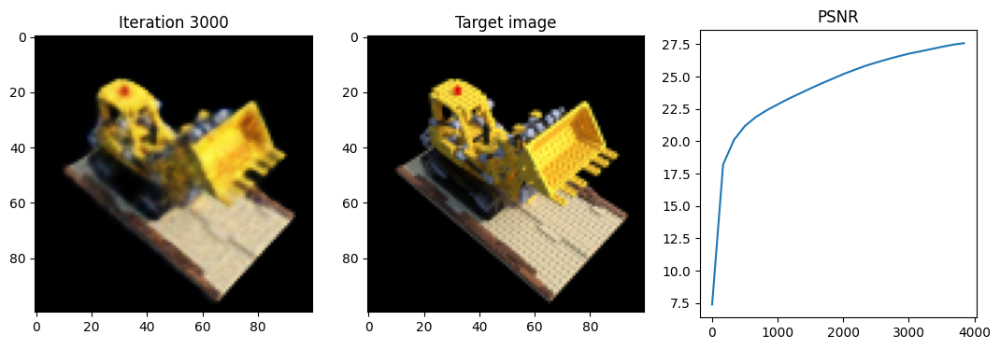

Iteration 4008  Loss: 0.0017  PSNR: 27.73 Time: 0.07 secs per iter 190.84 secs in total


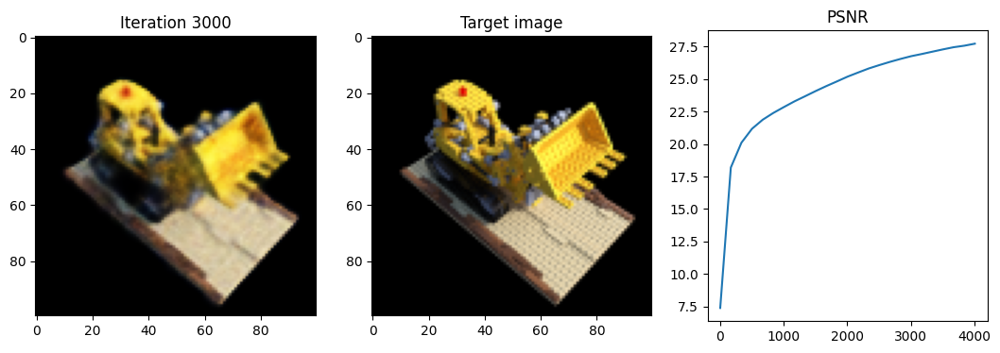

Iteration 4175  Loss: 0.0016  PSNR: 27.86 Time: 0.08 secs per iter 203.69 secs in total


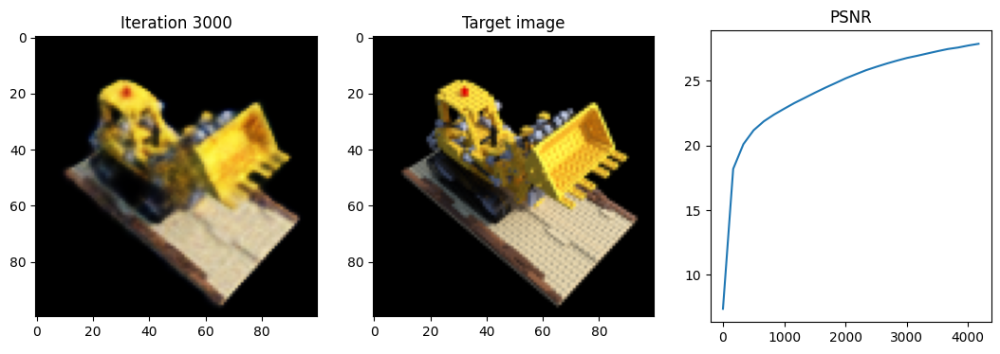

Iteration 4342  Loss: 0.0016  PSNR: 27.96 Time: 0.08 secs per iter 216.90 secs in total


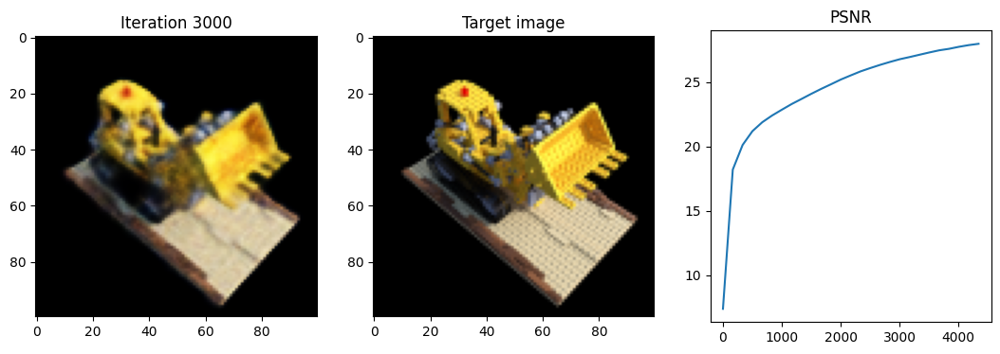

Iteration 4509  Loss: 0.0016  PSNR: 28.09 Time: 0.08 secs per iter 230.85 secs in total


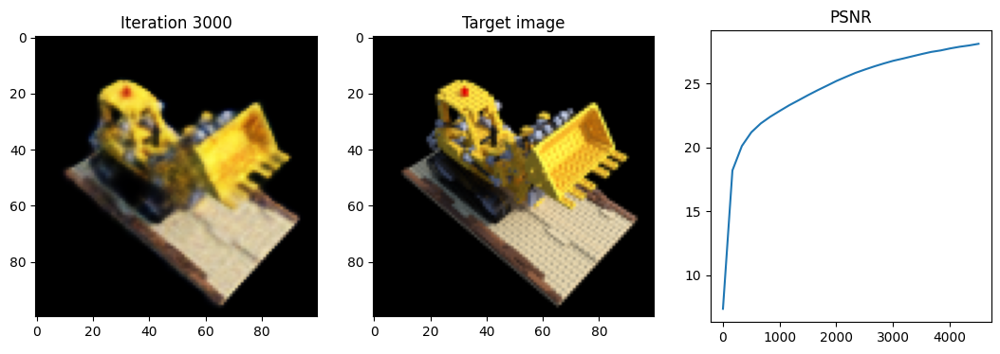

Iteration 4676  Loss: 0.0015  PSNR: 28.21 Time: 0.09 secs per iter 245.42 secs in total


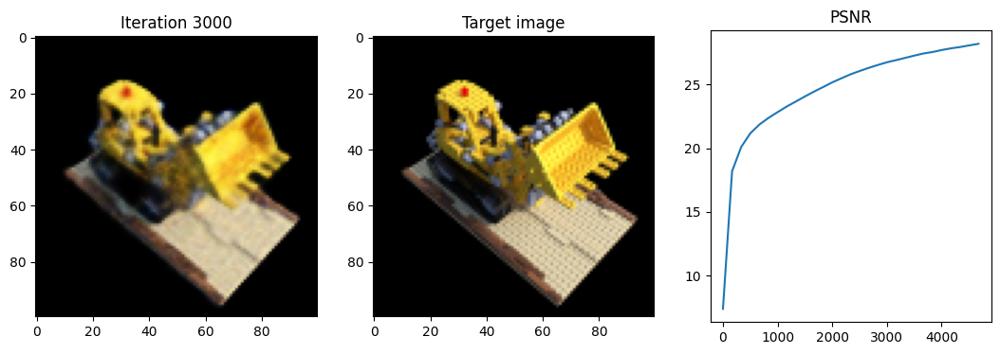

Iteration 4843  Loss: 0.0015  PSNR: 28.30 Time: 0.10 secs per iter 261.55 secs in total


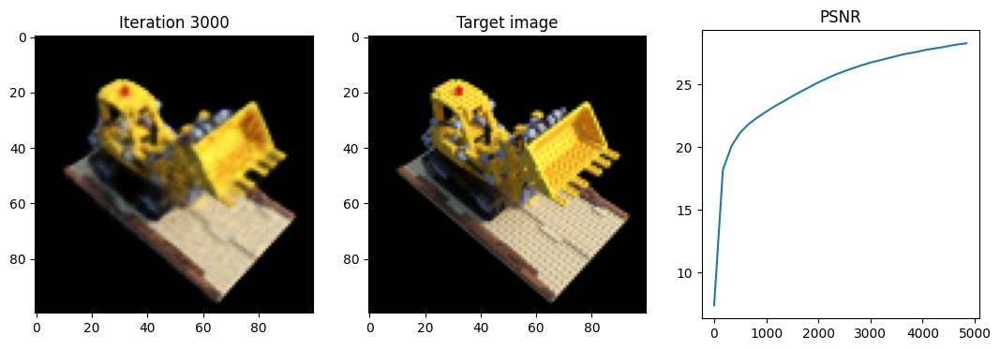

Iteration 5010  Loss: 0.0014  PSNR: 28.41 Time: 0.10 secs per iter 278.06 secs in total


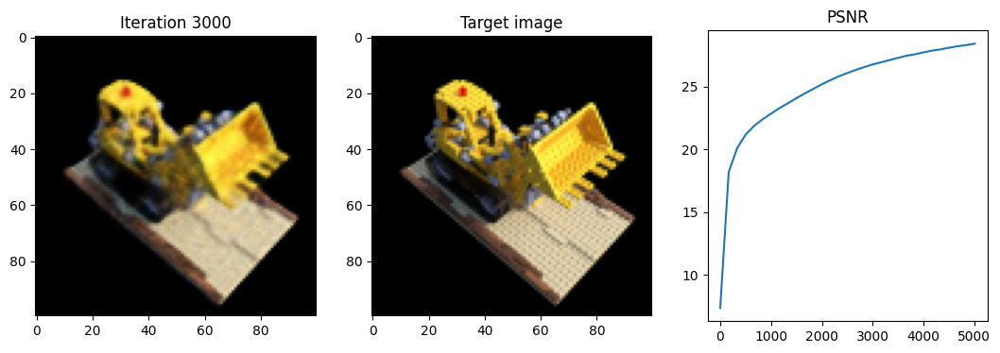

Iteration 5177  Loss: 0.0014  PSNR: 28.49 Time: 0.10 secs per iter 295.26 secs in total


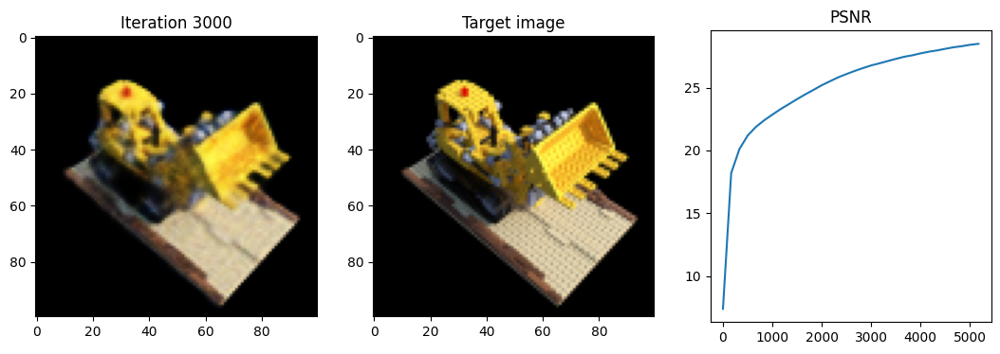

Iteration 5344  Loss: 0.0014  PSNR: 28.59 Time: 0.11 secs per iter 313.92 secs in total


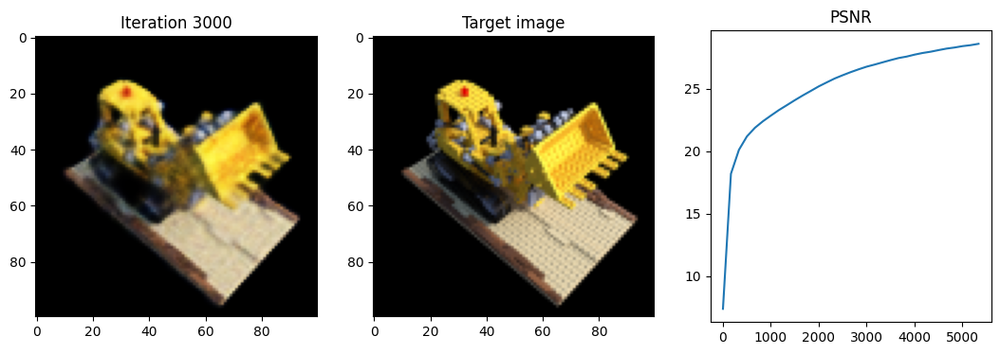

Iteration 5511  Loss: 0.0014  PSNR: 28.64 Time: 0.11 secs per iter 332.91 secs in total


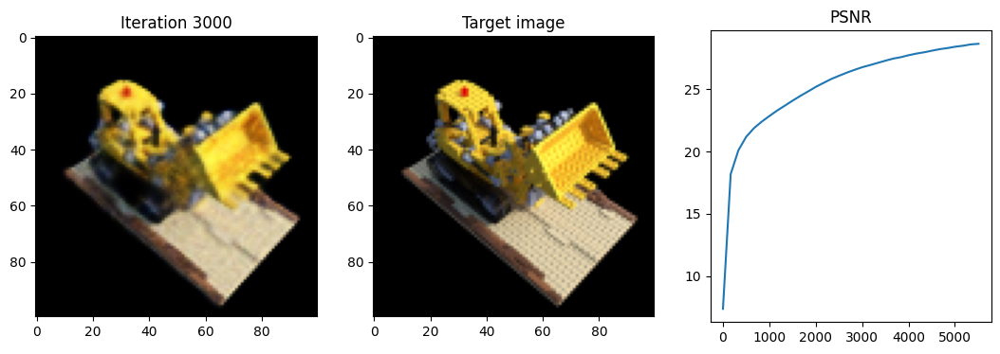

Iteration 5678  Loss: 0.0013  PSNR: 28.74 Time: 0.12 secs per iter 353.12 secs in total


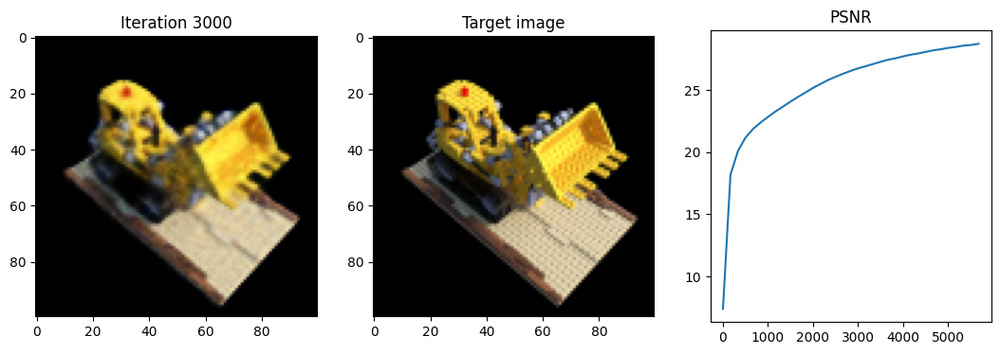

Iteration 5845  Loss: 0.0013  PSNR: 28.83 Time: 0.12 secs per iter 373.38 secs in total


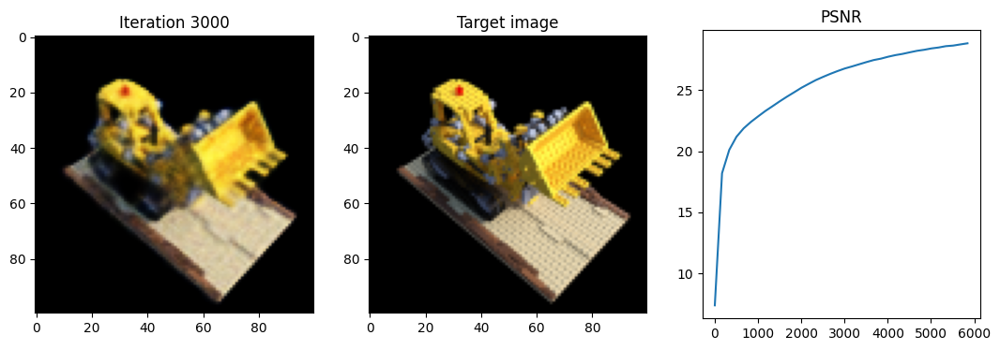

Iteration 6012  Loss: 0.0013  PSNR: 28.92 Time: 0.13 secs per iter 394.85 secs in total


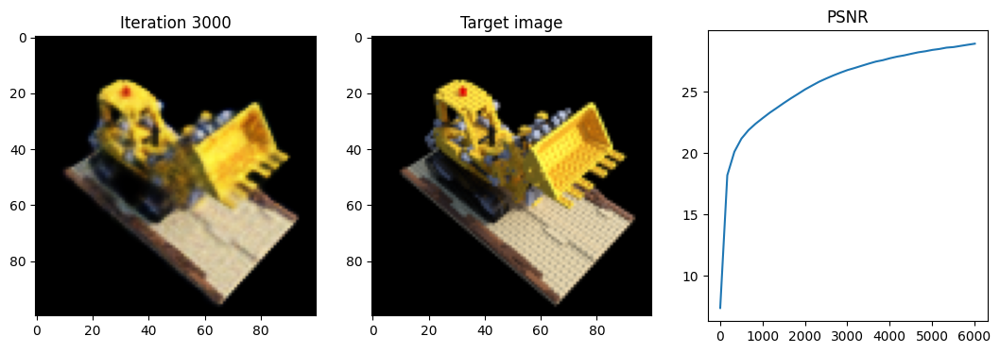

Iteration 6179  Loss: 0.0013  PSNR: 28.97 Time: 0.13 secs per iter 416.69 secs in total


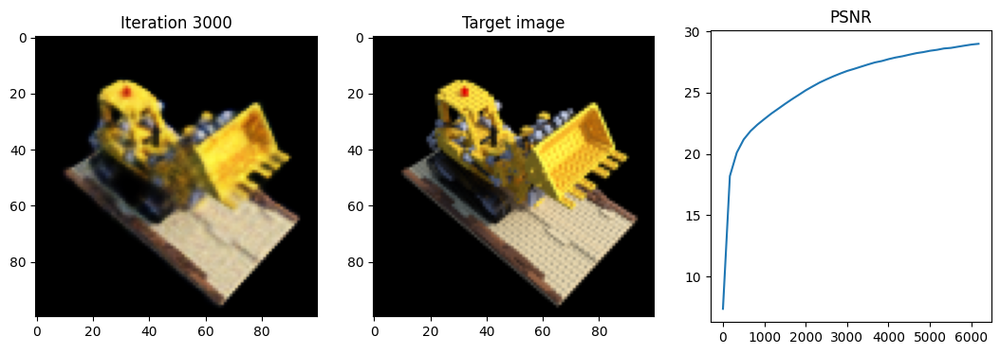

Iteration 6346  Loss: 0.0013  PSNR: 29.01 Time: 0.13 secs per iter 438.82 secs in total


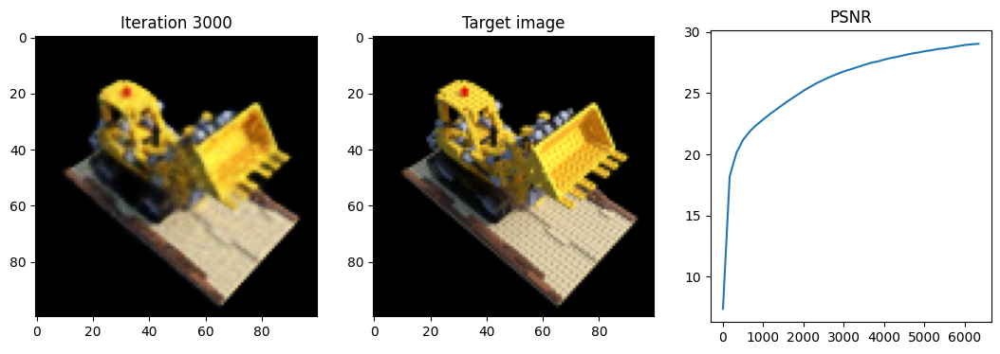

Iteration 6513  Loss: 0.0012  PSNR: 29.07 Time: 0.13 secs per iter 461.34 secs in total


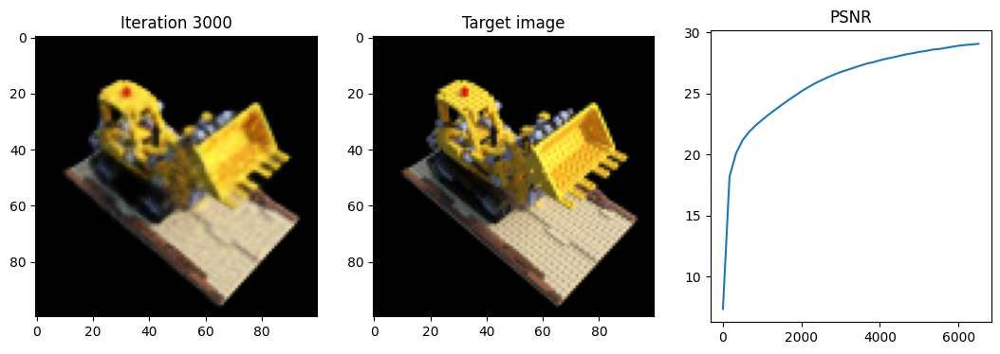

Iteration 6680  Loss: 0.0012  PSNR: 29.14 Time: 0.14 secs per iter 484.82 secs in total


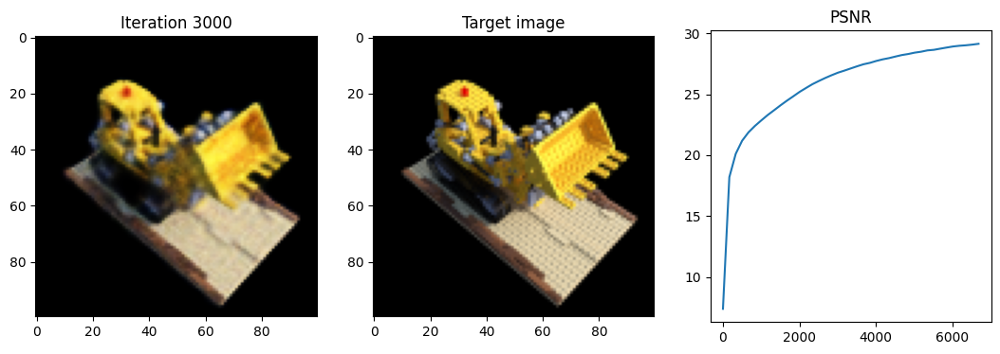

Iteration 6847  Loss: 0.0012  PSNR: 29.22 Time: 0.14 secs per iter 508.52 secs in total


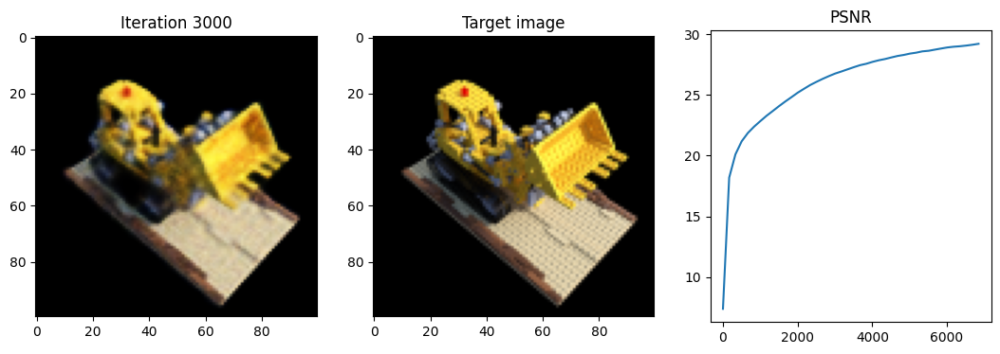

Iteration 7014  Loss: 0.0012  PSNR: 29.29 Time: 0.14 secs per iter 532.65 secs in total


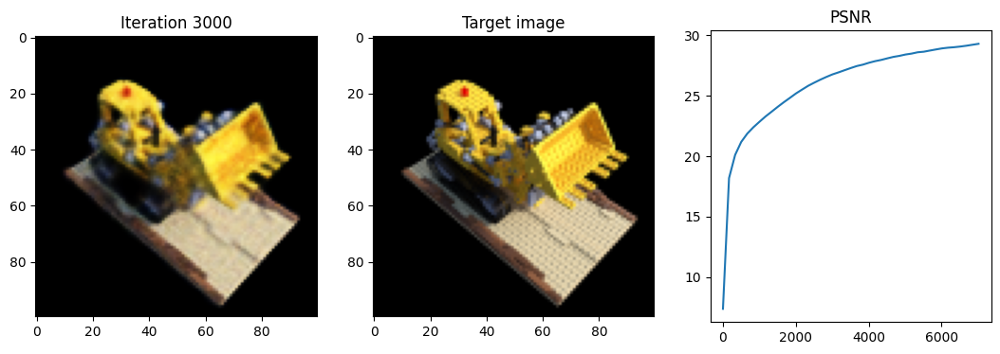

Iteration 7181  Loss: 0.0012  PSNR: 29.37 Time: 0.15 secs per iter 557.00 secs in total


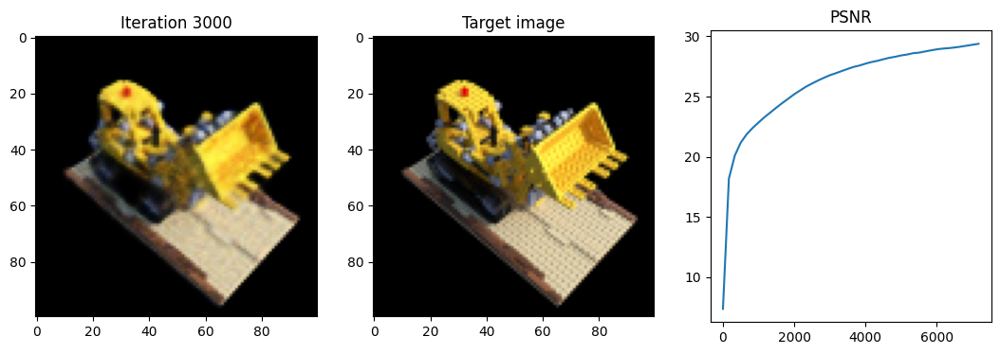

Iteration 7348  Loss: 0.0012  PSNR: 29.38 Time: 0.15 secs per iter 581.72 secs in total


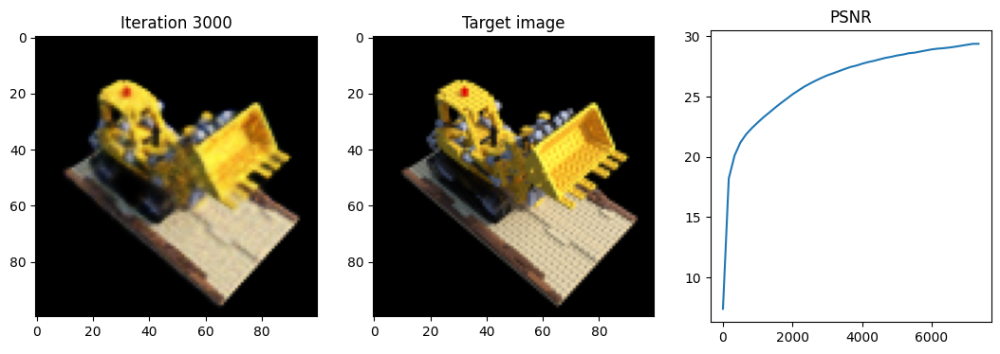

Iteration 7515  Loss: 0.0011  PSNR: 29.49 Time: 0.15 secs per iter 606.68 secs in total


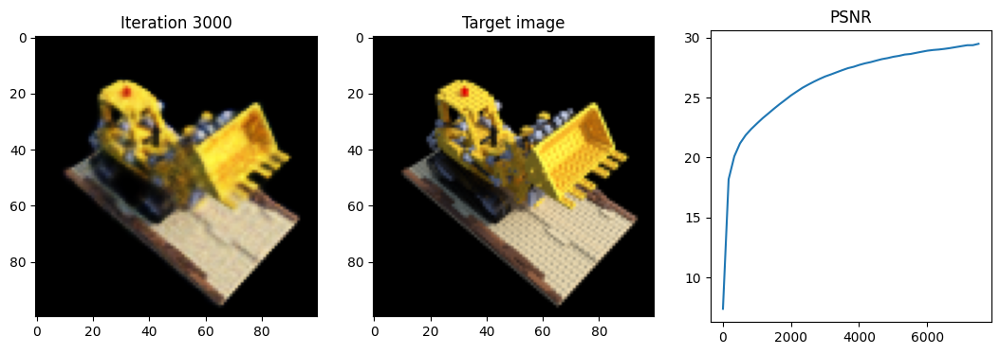

Iteration 7682  Loss: 0.0011  PSNR: 29.49 Time: 0.15 secs per iter 632.23 secs in total


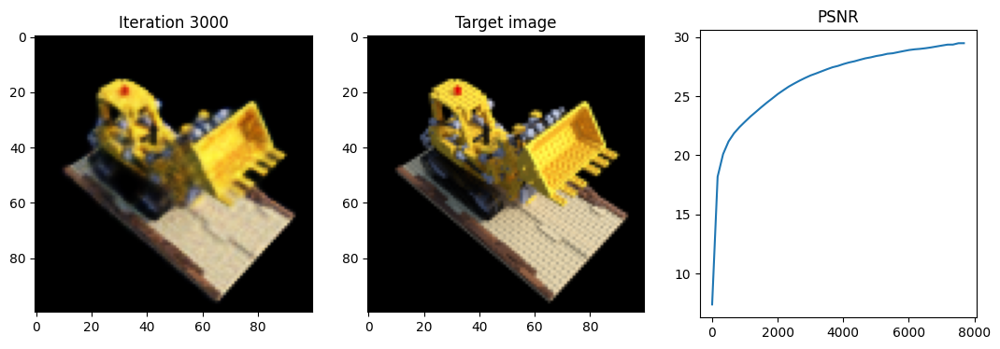

Iteration 7849  Loss: 0.0011  PSNR: 29.59 Time: 0.15 secs per iter 658.10 secs in total


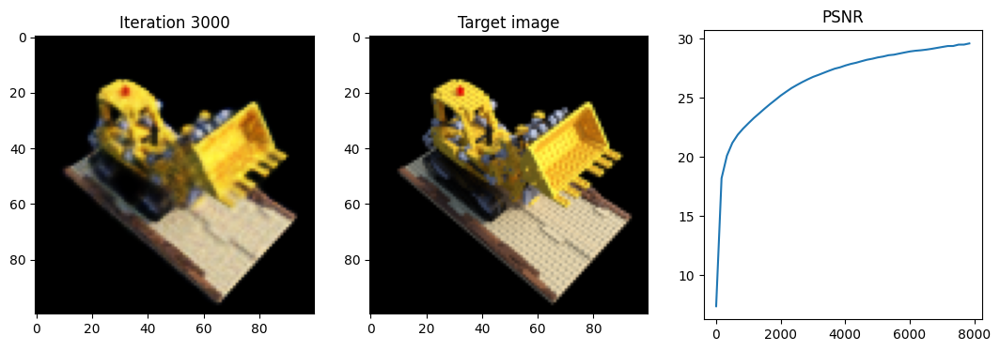

Iteration 8016  Loss: 0.0011  PSNR: 29.66 Time: 0.16 secs per iter 684.53 secs in total


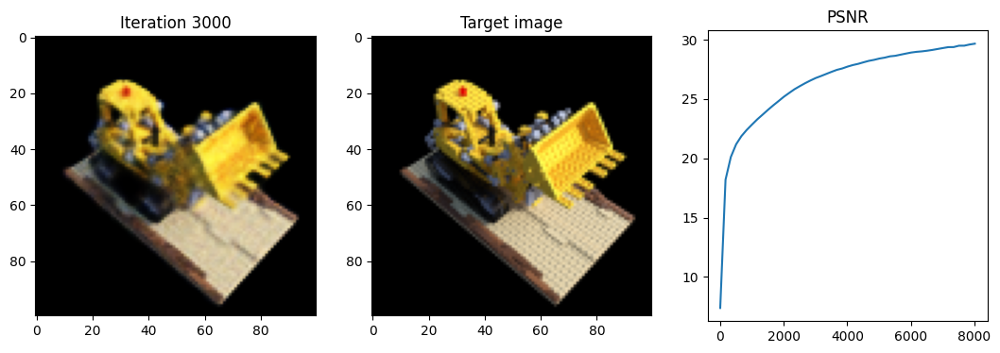

Iteration 8183  Loss: 0.0011  PSNR: 29.66 Time: 0.16 secs per iter 711.10 secs in total


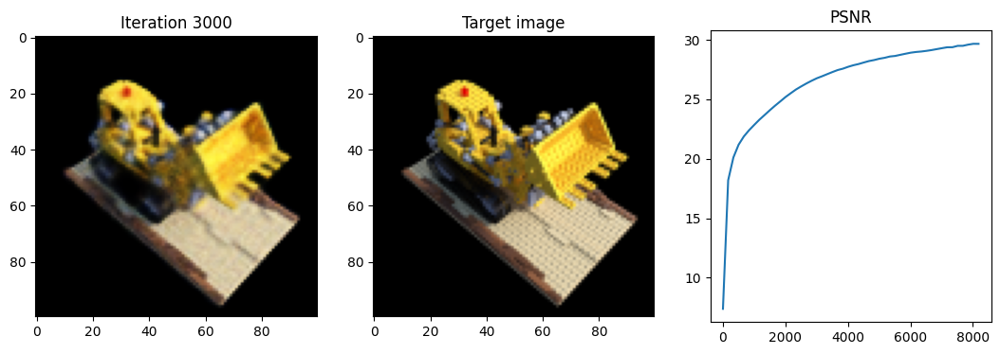

Iteration 8350  Loss: 0.0011  PSNR: 29.77 Time: 0.16 secs per iter 737.98 secs in total


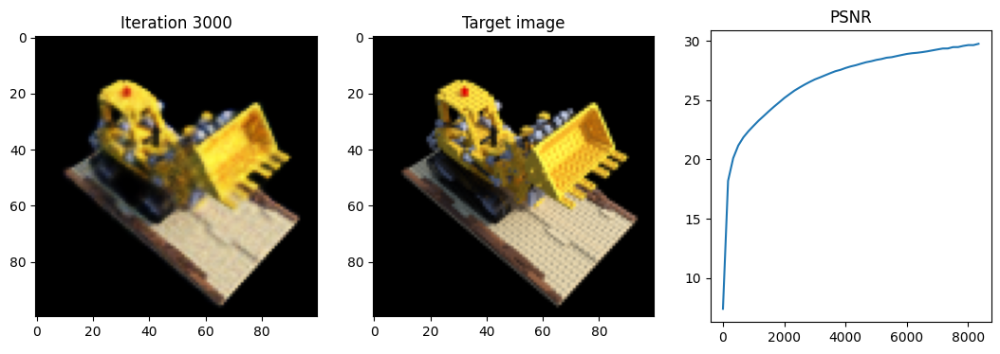

Iteration 8517  Loss: 0.0011  PSNR: 29.75 Time: 0.16 secs per iter 765.13 secs in total


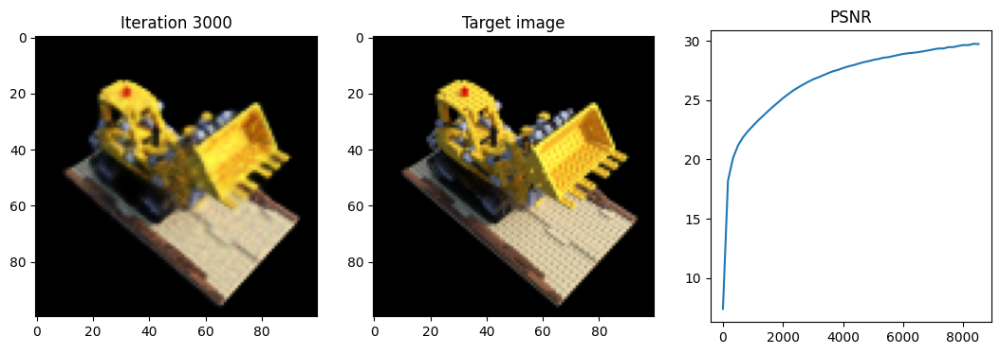

Iteration 8684  Loss: 0.0010  PSNR: 29.87 Time: 0.16 secs per iter 792.47 secs in total


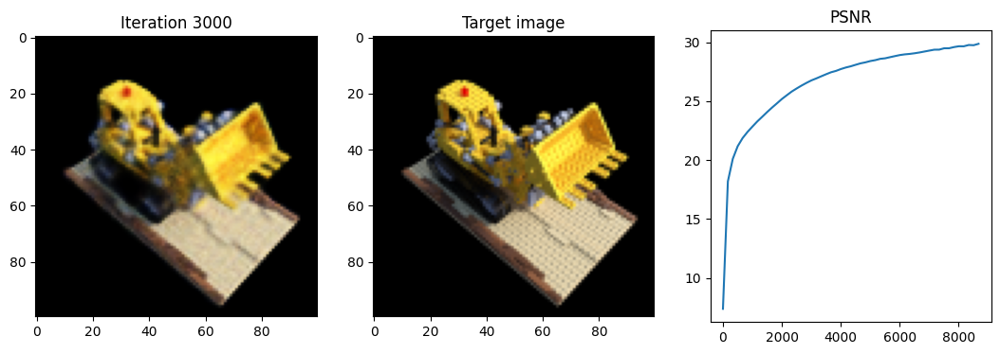

Iteration 8851  Loss: 0.0010  PSNR: 29.91 Time: 0.16 secs per iter 819.87 secs in total


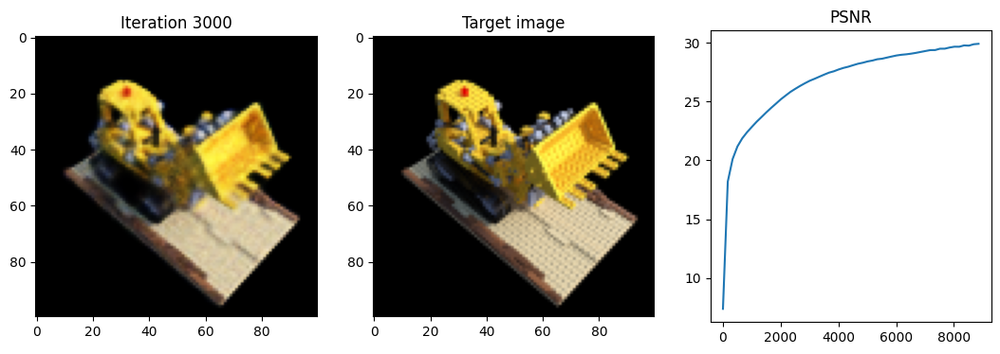

Iteration 9018  Loss: 0.0010  PSNR: 29.92 Time: 0.17 secs per iter 847.45 secs in total


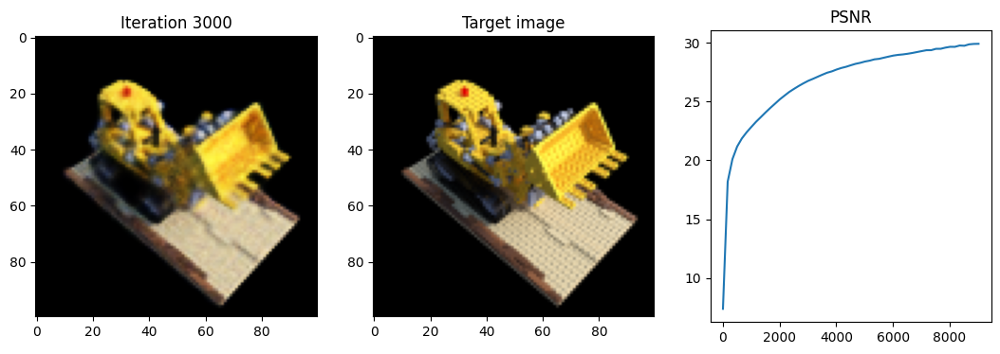

Iteration 9185  Loss: 0.0010  PSNR: 29.97 Time: 0.17 secs per iter 875.62 secs in total


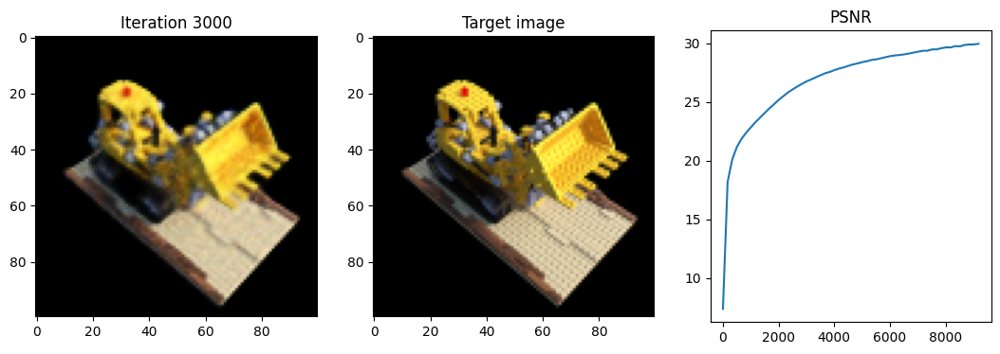

Iteration 9352  Loss: 0.0010  PSNR: 30.07 Time: 0.17 secs per iter 903.81 secs in total


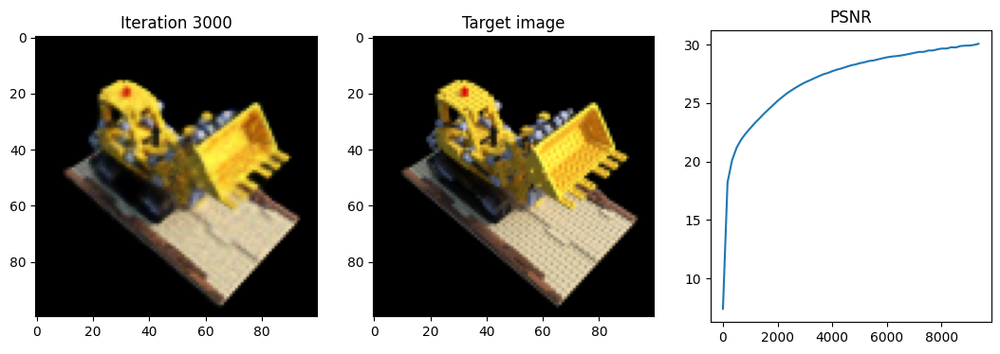

Iteration 9519  Loss: 0.0010  PSNR: 30.11 Time: 0.17 secs per iter 932.56 secs in total


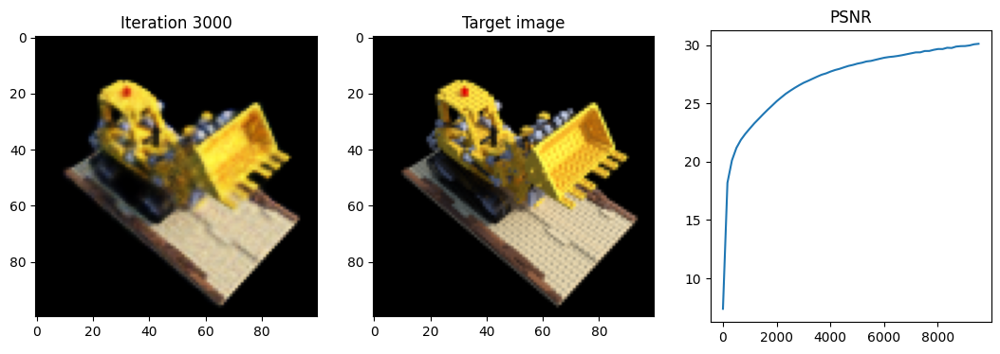

Iteration 9686  Loss: 0.0010  PSNR: 30.07 Time: 0.17 secs per iter 961.50 secs in total


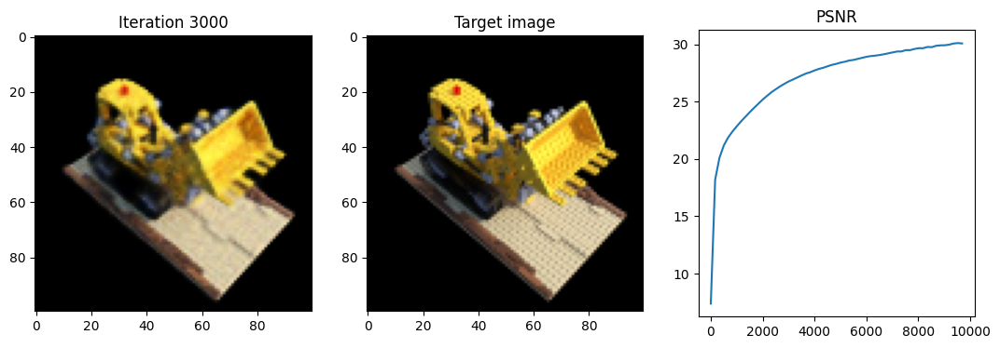

Iteration 9853  Loss: 0.0010  PSNR: 30.19 Time: 0.17 secs per iter 990.49 secs in total


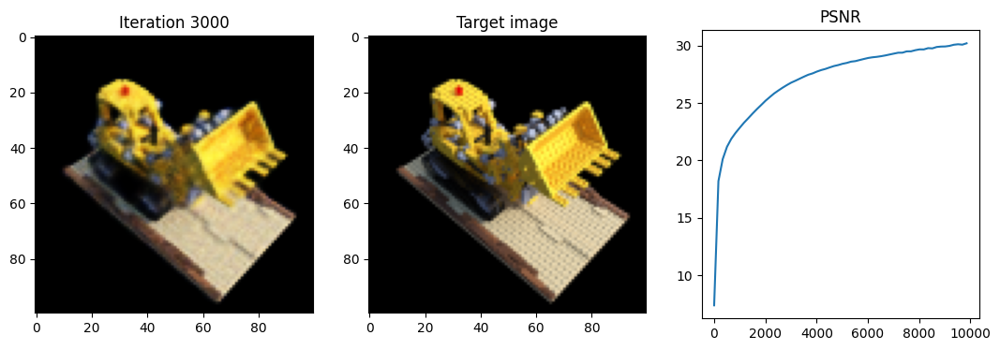

Done!


In [ ]:
_ = train_2d_model(test_img=test_image, num_frequencies=4, device=device)

### Part 2: Fitting a 3D Image

In [ ]:
import os
import gdown
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
import time

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cpu


In [ ]:
url = "https://drive.google.com/file/d/15W2EK8LooxTMfD0v5vo2BnBMse5ZzlVj/view?usp=share_link"
gdown.download(url=url, output='lego_data.npz', quiet=False, fuzzy=True)

Downloading...
From: https://drive.google.com/uc?id=15W2EK8LooxTMfD0v5vo2BnBMse5ZzlVj
To: /content/lego_data.npz
100%|██████████| 12.7M/12.7M [00:00<00:00, 216MB/s]


'lego_data.npz'

Here, we load the data that is comprised by the images, the R and T matrices of each camera position with respect to the world coordinates and the intrinsics parameters K of the camera.

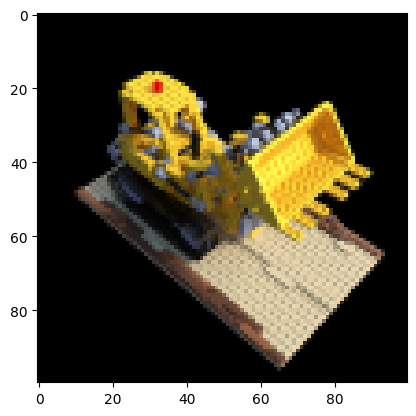

In [ ]:
# Load input images, poses, and intrinsics
data = np.load("lego_data.npz")

# Images
images = data["images"]

# Height and width of each image
height, width = images.shape[1:3]

# Camera extrinsics (poses)
poses = data["poses"]
poses = torch.from_numpy(poses).to(device)

# Camera intrinsics
intrinsics = data["intrinsics"]
intrinsics = torch.from_numpy(intrinsics).to(device)

# Hold one image out (for test).
test_image, test_pose = images[101], poses[101]
test_image = torch.from_numpy(test_image).to(device)

# Map images to device
images = torch.from_numpy(images[:100, ..., :3]).to(device)

plt.imshow(test_image.detach().cpu().numpy())
plt.show()

2.1 Complete the following function that calculates the rays that pass through all the pixels of an HxW image

In [ ]:
def get_rays(height, width, intrinsics, Rcw, Tcw):

    """
    Compute the origin and direction of rays passing through all pixels of an image (one ray per pixel).

    Args:
    height: the height of an image.
    width: the width of an image.
    intrinsics: camera intrinsics matrix of shape (3, 3).
    Rcw: Rotation matrix of shape (3,3) from camera to world coordinates.
    Tcw: Translation vector of shape (3,1) that transforms

    Returns:
    ray_origins (torch.Tensor): A tensor of shape (height, width, 3) denoting the centers of
      each ray. Note that desipte that all ray share the same origin, here we ask you to return
      the ray origin for each ray as (height, width, 3).
    ray_directions (torch.Tensor): A tensor of shape (height, width, 3) denoting the
      direction of each ray.
    """

    device = intrinsics.device
    ray_directions = np.zeros((height, width, 3))  # placeholder
    ray_origins = np.zeros((height, width, 3))  # placeholder

    #############################  TODO 2.1 BEGIN  ##########################
    Twc = (-1.0) * Rcw.T @ Tcw
    K_inv = Rcw @ np.linalg.inv(intrinsics.numpy())
    for i in range(height):
      for j in range(width):
          ray_origins[i, j, :3] = (-1.0) * (Rcw @ Twc)[:3]
          ray_directions[i, j, 0] = (K_inv @ np.array([[j], [i], [1]]))[0]
          ray_directions[i, j, 1] = (K_inv @ np.array([[j], [i], [1]]))[1]
          ray_directions[i, j, 2] = (K_inv @ np.array([[j], [i], [1]]))[2]

    ray_origins = torch.tensor(ray_origins)
    ray_directions = torch.tensor(ray_directions)
    #############################  TODO 2.1 END  ############################
    return print(ray_origins)

Complete the next function to visualize how is the dataset created. You will be able to see from which point of view each image has been captured for the 3D object. What we want to achieve here, is to being able to interpolate between these given views and synthesize new realistic views of the 3D object.

In [ ]:
def plot_all_poses(poses):

    #############################  TODO 2.1 BEGIN  ############################


    #############################  TODO 2.1 END  ############################

    ax = plt.figure(figsize=(12, 8)).add_subplot(projection='3d')
    _ = ax.quiver(origins[..., 0].flatten(),
                  origins[..., 1].flatten(),
                  origins[..., 2].flatten(),
                  directions[..., 0].flatten(),
                  directions[..., 1].flatten(),
                  directions[..., 2].flatten(), length=0.12, normalize=True)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('z')
    plt.show()

plot_all_poses(data['poses'])

2.2 Complete the following function to implement the sampling of points along a given ray.

In [ ]:
def stratified_sampling(ray_origins, ray_directions, near, far, samples):

    """
    Sample 3D points on the given rays. The near and far variables indicate the bounds of sampling range.

    Args:
    ray_origins: Origin of each ray in the "bundle" as returned by the
      get_rays() function. Shape: (height, width, 3).
    ray_directions: Direction of each ray in the "bundle" as returned by the
      get_rays() function. Shape: (height, width, 3).
    near: The 'near' extent of the bounding volume.
    far:  The 'far' extent of the bounding volume.
    samples: Number of samples to be drawn along each ray.

    Returns:
    ray_points: Query 3D points along each ray. Shape: (height, width, samples, 3).
    depth_points: Sampled depth values along each ray. Shape: (height, width, samples).
    """

    #############################  TODO 2.2 BEGIN  ############################
    height, width, z = ray_origins.shape
    ray_points = torch.zeros((height, width, samples, 3))
    depth_points = torch.zeros((height, width, samples))
    dist = far - near
    samples = torch.linspace(0, 1, samples, device=ray_origins.device)
    depth_points = near + dist * samples
    ray_points = ray_origins[..., None, :] + depth_points[..., None] * ray_directions[..., None, :]
    #############################  TODO 2.2 END  ############################
    return ray_points, depth_points

2.3 Define the network architecture of NeRF along with a function that divided data into chunks to avoid memory leaks during training.

In [ ]:
class nerf_model(nn.Module):

    """
    Define a NeRF model comprising eight fully connected layers and following the
    architecture described in the NeRF paper.
    """

    def __init__(self, filter_size=256, num_x_frequencies=6, num_d_frequencies=3):
        super().__init__()

        #############################  TODO 2.3 BEGIN  ############################
        self.fc1 = nn.Linear(num_x_frequencies * 6 + 3, filter_size)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(filter_size, filter_size)
        self.relu2 = nn.ReLU()
        self.fc3 = nn.Linear(filter_size, filter_size)
        self.relu3 = nn.ReLU()
        self.fc4 = nn.Linear(filter_size, filter_size)
        self.relu4 = nn.ReLU()
        self.fc5 = nn.Linear(filter_size, filter_size)
        self.relu5 = nn.ReLU()
        self.fc6 = nn.Linear(filter_size + num_x_frequencies * 6 + 3, filter_size)
        self.relu6 = nn.ReLU()
        self.fc7 = nn.Linear(filter_size, filter_size)
        self.relu7 = nn.ReLU()
        self.fc8 = nn.Linear(filter_size, filter_size)
        self.relu8 = nn.ReLU()
        self.fc8s = nn.Linear(filter_size, 1)
        self.fc9 = nn.Linear(filter_size, filter_size)
        self.relu10 = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        self.fc10 = nn.Linear(filter_size + num_d_frequencies * 6 + 3, 128)
        self.fc11 = nn.Linear(128, 3)
        #############################  TODO 2.3 END  ############################


    def forward(self, x, d):
        #############################  TODO 2.3 BEGIN  ############################
        output = self.fc1(x)
        output = self.relu1(output)
        output = self.fc2(output)
        output = self.relu2(output)
        output = self.fc3(output)
        output = self.relu3(output)
        output = self.fc4(output)
        output = self.relu4(output)
        output = self.fc5(output)
        output = self.relu5(output)
        output = torch.cat([output, x], dim=1)
        output = self.fc6(output)
        output = self.relu6(output)
        output = self.fc7(output)
        output = self.relu7(output)
        output = self.fc8(output)
        output = self.relu8(output)
        sigma = self.fc8s(output)
        output = self.fc9(output)
        output = torch.cat([output, d], dim=1)
        output = self.fc10(output)
        output = self.relu10(output)
        output = self.fc11(output)
        rgb = self.sigmoid(output)
        #############################  TODO 2.3 END  ############################
        return rgb, sigma

In [ ]:
def get_batches(ray_points, ray_directions, num_x_frequencies, num_d_frequencies):

    def get_chunks(inputs, chunksize = 2**15):
        return [inputs[i:i + chunksize] for i in range(0, inputs.shape[0], chunksize)]

    """
    This function returns chunks of the ray points and directions to avoid memory errors with the
    neural network. It also applies positional encoding to the input points and directions before
    dividing them into chunks, as well as normalizing and populating the directions.
    """
    #############################  TODO 2.3 BEGIN  ############################
    height, width, n_samples, _ = ray_points.shape
    dim = height * width * n_samples
    ray_directions_n = torch.zeros((height, width, n_samples, 3))
    for i in range(height):
       for j in range(width):
          for k in range(n_samples):
             norm = np.linalg.norm(ray_directions[i][j])
             ray_directions_n[i][j][k] = ray_directions[i][j] / norm

    ray_points = ray_points.reshape((dim, 3))
    ray_directions = ray_directions_n.reshape((dim, 3))

    ray_points = positional_encoding(ray_points, num_x_frequencies)
    ray_directions = positional_encoding(ray_directions, num_d_frequencies)

    ray_points_batches = get_chunks(ray_points)
    ray_directions_batches = get_chunks(ray_directions)
    #############################  TODO 2.3 END  ############################

    return ray_points_batches, ray_directions_batches

2.4 Compute the compositing weights of samples on camera ray and then complete the volumetric rendering procedure to reconstruct a whole RGB image from the sampled points and the outputs of the neural network.

In [ ]:
def volumetric_rendering(rgb, s, depth_points):

    """
    Differentiably renders a radiance field, given the origin of each ray in the
    "bundle", and the sampled depth values along them.

    Args:
    rgb: RGB color at each query location (X, Y, Z). Shape: (height, width, samples, 3).
    sigma: Volume density at each query location (X, Y, Z). Shape: (height, width, samples).
    depth_points: Sampled depth values along each ray. Shape: (height, width, samples).

    Returns:
    rec_image: The reconstructed image after applying the volumetric rendering to every pixel.
    Shape: (height, width, 3)
    """

    #############################  TODO 2.4 BEGIN  ############################
    height, width, n_samples = s.shape
    rec_image = torch.zeros((height, width, 3))

    for i in range(height):
       for j in range(width):
          sig = F.relu(s[i, j].data)

          delta = depth_points[i, j, 1:n_samples] - depth_points[i, j, :n_samples-1]
          delta = torch.cat((delta, torch.tensor([10 ** 9])), dim=0)

          T_ = torch.exp((-1.0) * sig * delta)
          T_ = torch.cat((torch.tensor([1]), T_[:n_samples-1]), dim=0)

          T = torch.cumprod(T_, dim=0)

          c_r_final = T - T*(torch.exp((-1.0) * sig * delta)) * (rgb[i, j].T)[0]
          c_g_final = T - T*(torch.exp((-1.0) * sig * delta)) * (rgb[i, j].T)[1]
          c_b_final = T - T*(torch.exp((-1.0) * sig * delta)) * (rgb[i, j].T)[2]

          rec_image[i, j, 0] = torch.sum(c_r_final)
          rec_image[i, j, 1] = torch.sum(c_g_final)
          rec_image[i, j, 2] = torch.sum(c_b_final)
    #############################  TODO 2.4 END  ############################

    return rec_image

2.5 Combine everything together. Given the pose position of a camera, compute the camera rays and sample the 3D points along these rays. Divide those points into batches and feed them to the neural network. Concatenate them and use them for the volumetric rendering to reconstructed the final image.

In [ ]:
def one_forward_pass(height, width, intrinsics, pose, near, far, samples, model, num_x_frequencies, num_d_frequencies):

    #############################  TODO 2.5 BEGIN  ############################

    # Generate camera rays
    u, v = torch.meshgrid(torch.arange(0, width), torch.arange(0, height))
    u = u.to(torch.float32)
    v = v.to(torch.float32)

    fx, fy, cx, cy = intrinsics
    ray_directions = torch.stack([(u - cx) / fx, (v - cy) / fy, torch.ones_like(u)], dim=-1)
    ray_origins = torch.zeros_like(ray_directions)

    # Transform camera rays to world coordinates
    ray_origins = torch.einsum('ij,kj->ki', pose[:3, :3].inverse(), ray_origins) + pose[:3, 3]

    # Sample points along rays
    t_values = torch.linspace(near, far, samples, device=pose.device)
    points = ray_origins.unsqueeze(1) + ray_directions.unsqueeze(1) * t_values.unsqueeze(-1)

    # Batch the points for neural network processing
    batch_size = points.shape[0]
    points = points.view(batch_size, -1, 3)

    # Forward pass through the neural network
    features = model(points)

    # Volumetric rendering
    color_volume = torch.zeros(batch_size, height, width, 3, device=pose.device)
    alpha_volume = torch.zeros(batch_size, height, width, device=pose.device)

    for x_freq in range(num_x_frequencies):
        for d_freq in range(num_d_frequencies):
            cos_x = torch.cos(2.0 * x_freq * points[:, :, 0])
            cos_d = torch.cos(2.0 * d_freq * points[:, :, 2])
            cos_product = cos_x * cos_d

            alpha_volume += cos_product
            color_volume += cos_product.unsqueeze(-1) * features.unsqueeze(2)

    # Normalize alpha and compute final image
    alpha_volume = torch.clamp(alpha_volume / (num_x_frequencies * num_d_frequencies), 0.0, 1.0)
    final_image = torch.sum(color_volume * alpha_volume.unsqueeze(-1), dim=1)

    #############################  TODO 2.5 END  ############################

    return rec_image

If you manage to pass the autograder for all the previous functions, then it is time to train a NeRF! We provide the hyperparameters for you, we initialize the NeRF model and its weights, and we define a couple lists that will be needed to store results.

In [ ]:
num_x_frequencies = 10
num_d_frequencies = 4
learning_rate  = 5e-4
iterations = 3000
samples = 64
display = 25
near = 0.667
far = 2

model = nerf_model(num_x_frequencies=num_x_frequencies,num_d_frequencies=num_d_frequencies).to(device)

def weights_init(m):
    if isinstance(m, torch.nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)
model.apply(weights_init)

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

psnrs = []
iternums = []

t = time.time()
t0 = time.time()

In [ ]:
for i in range(iterations+1):

    #############################  TODO 2.6 BEGIN  ############################

    #choose randomly a picture for the forward pass



    # Run one iteration of NeRF and get the rendered RGB image.



    # Compute mean-squared error between the predicted and target images. Backprop!





    #############################  TODO 2.6 END  ############################

    # Display images/plots/stats
    if i % display == 0:
        with torch.no_grad():
        #############################  TODO 2.6 BEGIN  ############################
            # Render the held-out view



        #calculate the loss and the psnr between the original test image and the reconstructed one.


        #############################  TODO 2.6 END  ############################

        print("Iteration %d " % i, "Loss: %.4f " % loss.item(), "PSNR: %.2f " % psnr.item(), \
                "Time: %.2f secs per iter, " % ((time.time() - t) / display), "%.2f mins in total" % ((time.time() - t0)/60))

        t = time.time()
        psnrs.append(psnr.item())
        iternums.append(i)

        plt.figure(figsize=(16, 4))
        plt.subplot(141)
        plt.imshow(test_rec_image.detach().cpu().numpy())
        plt.title(f"Iteration {i}")
        plt.subplot(142)
        plt.imshow(test_image.detach().cpu().numpy())
        plt.title("Target image")
        plt.subplot(143)
        plt.plot(iternums, psnrs)
        plt.title("PSNR")
        plt.show()

print('Done!')